In [2]:
#import packages 
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import os
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx #add base maps
from matplotlib_scalebar.scalebar import ScaleBar 

In [3]:
FS_food_access = pd.read_csv(r'2_processed data\2023_FS_wys_lsoa_accessiblity.csv')
All_charities_access = pd.read_csv(r'2_processed data\2023_all_charities_wys_lsoa_accessiblity.csv')
ppfi = pd.read_csv(r'1_raw data\ppfi_v2.1.csv')


In [6]:
FS_food_access.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1404 entries, 0 to 1403
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            1404 non-null   int64  
 1   LSOA21CD              1404 non-null   object 
 2   LSOA21NM              1404 non-null   object 
 3   geometry              1404 non-null   object 
 4   nc_walk_15            1404 non-null   float64
 5   nc_walk_30            1404 non-null   float64
 6   nc_transit_15         1404 non-null   float64
 7   nc_transit_30         1404 non-null   float64
 8   fnv_walk_15           1404 non-null   float64
 9   na_walk_15            1404 non-null   float64
 10  unhealthy_walk_15     1404 non-null   float64
 11  carb_walk_15          1404 non-null   float64
 12  protien_walk_15       1404 non-null   float64
 13  dairy_walk_15         1404 non-null   float64
 14  oil_walk_15           1404 non-null   float64
 15  fnv_walk_30          

In [7]:
# Normalisation of quantity of food accessible data 
# copy the data 
FS_food_access_scaled = FS_food_access.copy() 
  
# apply normalization techniques 
for column in FS_food_access_scaled.iloc[:, 8:35].columns: 
    FS_food_access_scaled[column] = FS_food_access_scaled[column]  / FS_food_access_scaled[column].abs().max() 
      
# view normalized data 
display(FS_food_access_scaled) 


,Unnamed: 0,LSOA21CD,LSOA21NM,geometry,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30,fnv_walk_15,na_walk_15,...,fnv_transit_30,na_transit_30,unhealthy_transit_30,carb_transit_30,protien_transit_30,dairy_transit_30,oil_transit_30,geography code,Age: Total,pop_u15
0,0,E01010568,Bradford 016A,"POLYGON ((416422.17 439366.289000001, 416475.1...",0.00,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,E01010568,1716,275
1,1,E01010569,Bradford 016B,"POLYGON ((415371.559 439225.549000001, 415417....",0.00,0.333333,0.0,0.833333,0.000000,0.000000,...,0.010109,0.012255,0.009348,0.009254,0.006582,0.007123,0.0,E01010569,1752,317
2,2,E01010570,Bradford 018A,"POLYGON ((413955.24 439413.594000001, 414146.5...",0.00,0.500000,0.0,0.500000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,E01010570,1498,223
3,3,E01010571,Bradford 016C,"POLYGON ((415809.999 438803.797, 415760.9763 4...",0.00,0.666667,0.0,1.666667,0.000000,0.000000,...,0.029889,0.032742,0.029640,0.024656,0.027151,0.022763,0.0,E01010571,1946,399
4,4,E01010572,Bradford 016D,"POLYGON ((415579.8308 439222.989800001, 415712...",0.00,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,E01010572,1486,205
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1399,1399,E01035050,Leeds 105G,"POLYGON ((430737.415 427501.249, 430760.513 42...",1.25,7.000000,1.5,9.250000,0.006105,0.008528,...,0.169736,0.153322,0.171661,0.149935,0.180298,0.166668,0.0,E01035050,1619,424
1400,1400,E01035051,Leeds 105H,"POLYGON ((431229.959 427511.255000001, 431264....",0.00,5.250000,0.0,6.000000,0.000000,0.000000,...,0.094983,0.089172,0.097126,0.085741,0.106086,0.103064,0.0,E01035051,1608,354
1401,1401,E01035052,Leeds 105I,"POLYGON ((431312.508 427066, 431268.346 426814...",0.00,0.500000,0.0,0.500000,0.000000,0.000000,...,0.000639,0.001405,0.001626,0.000824,0.000409,0.000441,0.0,E01035052,1453,306
1402,1402,E01035053,Leeds 105J,"POLYGON ((432214.264 427106.239, 432235.065 42...",0.20,0.400000,0.2,0.400000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,E01035053,1734,443


In [8]:
ppfi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43538 entries, 0 to 43537
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   lsoa21cd                                 43538 non-null  object 
 1   domain_supermarket_proximity             43538 non-null  int64  
 2   domain_supermarket_accessibility         42648 non-null  float64
 3   domain_ecommerce_access                  42648 non-null  float64
 4   domain_socio_demographic                 43538 non-null  int64  
 5   domain_nonsupermarket_proximity          43538 non-null  int64  
 6   domain_food_for_families                 43538 non-null  int64  
 7   domain_fuel_poverty                      42648 non-null  float64
 8   country                                  43538 non-null  object 
 9   country_denominator                      43538 non-null  int64  
 10  combined                                 43538

In [12]:
ppfi_subset = ppfi.drop(ppfi.iloc[:, 1:10],axis = 1)
ppfi_subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43538 entries, 0 to 43537
Data columns (total 10 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   lsoa21cd                                 43538 non-null  object 
 1   combined                                 43538 non-null  int64  
 2   pp_dec_domain_supermarket_proximity      43538 non-null  int64  
 3   pp_dec_domain_supermarket_accessibility  42648 non-null  float64
 4   pp_dec_domain_ecommerce_access           42648 non-null  float64
 5   pp_dec_domain_socio_demographic          43538 non-null  int64  
 6   pp_dec_domain_nonsupermarket_proximity   43538 non-null  int64  
 7   pp_dec_domain_food_for_families          43538 non-null  int64  
 8   pp_dec_domain_fuel_poverty               42648 non-null  float64
 9   pp_dec_combined                          43538 non-null  int64  
dtypes: float64(3), int64(6), object(1)
memory usag

In [10]:
FS_ppfi = pd.merge(FS_food_access_scaled, ppfi, how='left', left_on =['LSOA21CD'], right_on=['lsoa21cd']).drop(["lsoa21cd"],axis=1)

In [11]:
FS_ppfi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1404 entries, 0 to 1403
Data columns (total 57 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Unnamed: 0                               1404 non-null   int64  
 1   LSOA21CD                                 1404 non-null   object 
 2   LSOA21NM                                 1404 non-null   object 
 3   geometry                                 1404 non-null   object 
 4   nc_walk_15                               1404 non-null   float64
 5   nc_walk_30                               1404 non-null   float64
 6   nc_transit_15                            1404 non-null   float64
 7   nc_transit_30                            1404 non-null   float64
 8   fnv_walk_15                              1404 non-null   float64
 9   na_walk_15                               1404 non-null   float64
 10  unhealthy_walk_15                        1404 no

### Load and clip OA centroids and shapes for West Yorkshire

In [105]:
# load Output Areas' Population Weighed Centroids 
oapwc = gpd.read_file('1_raw data\Census and admin boundaries\Output_Areas_2021_PWC_V3_-2091752234720525558.geojson')
oapwc.head()

,FID,OA21CD,GlobalID,geometry
0,1,E00072563,a4bad342-0370-4508-be01-053abd9888db,POINT (375132.258 165456.117)
1,2,E00102783,bbbbb78d-b25e-4eea-8b36-9f96869ff53a,POINT (244354.928 100091.933)
2,3,E00116937,fe185557-775b-4d68-a03e-4d175ebb20a2,POINT (447582.777 101527.001)
3,4,E00147789,ec64f266-af06-4449-9d4d-b95da327af34,POINT (354110.044 134922.042)
4,5,E00077832,89b2207d-1282-43a7-a5c7-163577cc48a2,POINT (404713.569 92612.319)


In [106]:
#include LSOA attributes from the csv file for furhter data joins
oapwc_csv = pd.read_csv('1_raw data\Census and admin boundaries\Output_Areas_(December_2021)_Boundaries_EW_BFE_(V9).csv')[['OA21CD','LSOA21CD','LSOA21NM']]
oapwc_csv.head()

,OA21CD,LSOA21CD,LSOA21NM
0,E00000001,E01000001,City of London 001A
1,E00000003,E01000001,City of London 001A
2,E00000005,E01000001,City of London 001A
3,E00000007,E01000001,City of London 001A
4,E00000010,E01000003,City of London 001C


In [107]:
oapwc = pd.merge(oapwc, oapwc_csv, left_on='OA21CD', right_on= 'OA21CD', how='left')
oapwc.head()

,FID,OA21CD,GlobalID,geometry,LSOA21CD,LSOA21NM
0,1,E00072563,a4bad342-0370-4508-be01-053abd9888db,POINT (375132.258 165456.117),E01014370,Bath and North East Somerset 007A
1,2,E00102783,bbbbb78d-b25e-4eea-8b36-9f96869ff53a,POINT (244354.928 100091.933),E01020290,Torridge 009C
2,3,E00116937,fe185557-775b-4d68-a03e-4d175ebb20a2,POINT (447582.777 101527.001),E01023015,New Forest 014C
3,4,E00147789,ec64f266-af06-4449-9d4d-b95da327af34,POINT (354110.044 134922.042),E01029019,Mendip 013A
4,5,E00077832,89b2207d-1282-43a7-a5c7-163577cc48a2,POINT (404713.569 92612.319),E01015393,"Bournemouth, Christchurch and Poole 032D"


In [108]:
 #filter West Yorkshire features using LSOA names
wys = ['Calderdale', 'Leeds', 'Bradford', 'Kirklees', 'Wakefield']
wys_oapwc = oapwc[oapwc.LSOA21NM.str.contains('|'.join(wys))]
wys_oapwc

,FID,OA21CD,GlobalID,geometry,LSOA21CD,LSOA21NM
54086,54087,E00059063,79bb3b12-ea9a-435a-a722-27de07ad9dd4,POINT (435547.178 437859.211),E01011717,Leeds 029C
54088,54089,E00054714,538e5c50-9fbb-441f-afb4-d5c070d52bc8,POINT (403970.892 437910.389),E01010861,Bradford 023F
54091,54092,E00055286,4872e90b-1cc1-47a9-900d-174a3b99326c,POINT (407971.296 423883.178),E01010970,Calderdale 016B
54092,54093,E00059020,530c9ad2-0d52-43d3-98d4-1ea86a4477b7,POINT (440533.171 449476.152),E01011700,Leeds 002B
54094,54095,E00060054,83d16a90-21f0-4ded-8e30-f7a804a1432f,POINT (433997.312 421516.943),E01011910,Wakefield 020B
...,...,...,...,...,...,...
73073,73074,E00058197,712b5fb3-c298-4c54-89fe-b32f1b3d7347,POINT (426245.894 427185.581),E01011541,Leeds 104B
73074,73075,E00059012,ec68055b-3680-4c5f-87d5-ff414b1abeeb,POINT (440377.117 449573.548),E01011699,Leeds 001B
73077,73078,E00056577,24c3c955-23f6-4f64-a9c4-fd077dc89fa5,POINT (414397.224 414792.948),E01011226,Kirklees 048B
73078,73079,E00060036,f533889b-a43f-473d-ae1e-d8ce1ab6f52e,POINT (430634.126 419347.168),E01011903,Wakefield 028B


In [109]:
wys_oapwc = wys_oapwc.drop(['GlobalID', 'FID'], axis=1)

### Merge age group data 

In [110]:
age = pd.read_csv("1_raw data\census_2021_NOMIS\census2021_Age by five-year age bands\census2021-ts007a-oa.csv")
age['pop_u15'] = age['Age: Aged 4 years and under']+age['Age: Aged 5 to 9 years']+age['Age: Aged 10 to 14 years']

age = age[['date','geography','geography code','Age: Total','pop_u15']].rename(columns={"Age: Total":"pop_total"})
age.head()

,date,geography,geography code,pop_total,pop_u15
0,2021,E00000001,E00000001,177,14
1,2021,E00000003,E00000003,259,34
2,2021,E00000005,E00000005,111,6
3,2021,E00000007,E00000007,147,5
4,2021,E00000010,E00000010,179,7


In [111]:
age_merge = age[['geography code','pop_total','pop_u15']]

wys_oa = pd.merge(wys_oapwc, age_merge, left_on='OA21CD', right_on= 'geography code', how='left')
wys_oa.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23


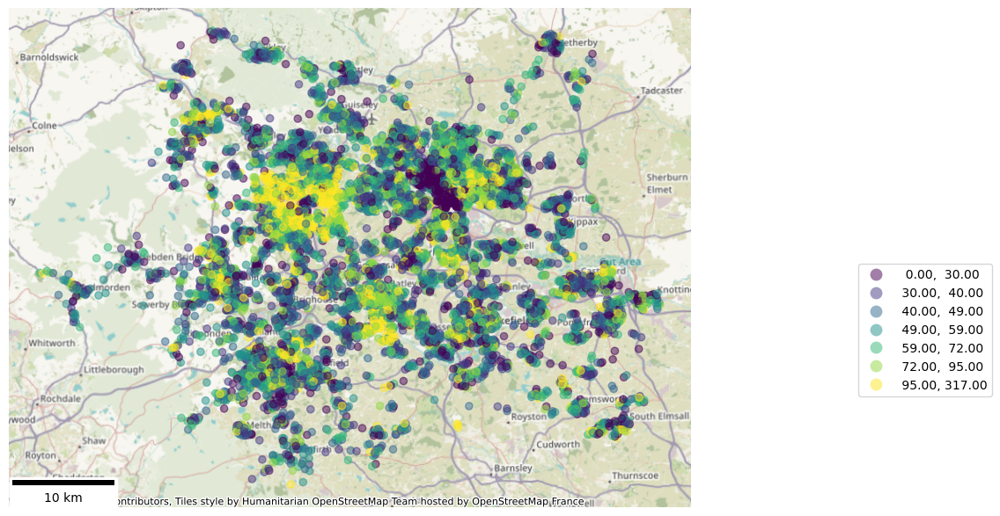

In [112]:
fig, ax = plt.subplots(1, figsize=(10,10))
wys_oa.to_crs(27700).plot(ax = ax,column = 'pop_u15', scheme = 'quantiles', cmap = 'viridis', k = 7 ,legend = True, alpha = 0.5)
ctx.add_basemap(ax, crs = 27700 , source=ctx.providers.OpenStreetMap.HOT) 

leg = ax.get_legend()
leg.set_bbox_to_anchor((1.45,0.5))
scale1 = ScaleBar(dx=1,location='lower left') #create a scale bar, with dx set to the number of pixels per unit, and 
ax.add_artist(scale1) #plot the scale bar


ax.set_axis_off()
plt.show()

## 2.1 Number of FS charities accessible

In [113]:
#load OD walking time matrix
od_walk = pd.read_csv("2_processed data\OD travel time\OD_travel_time_walking.csv")
od_walk.head()

,from_id,to_id,travel_time
0,E00060205,119,29.0
1,E00060227,119,21.0
2,E00060228,119,23.0
3,E00060007,119,28.0
4,E00060005,119,23.0


In [114]:
#Identify number of charities accessible in 15 and 30 minute walking thresholds on OA level
# nc is short for Number of Charities
nc_walk_15 = od_walk[od_walk.travel_time <=15].groupby('from_id').count().reset_index()
nc_walk_15 = nc_walk_15.drop(['travel_time'], axis=1).rename(columns={"to_id":"nc_walk_15"})

nc_walk_30 = od_walk[od_walk.travel_time <=30].groupby('from_id').count().reset_index()
nc_walk_30 = nc_walk_30.drop(['travel_time'], axis=1).rename(columns={"to_id":"nc_walk_30"})

In [115]:
wys_oa_f = pd.merge(wys_oa, nc_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = pd.merge(wys_oa_f, nc_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.astype({"nc_walk_15": int, "nc_walk_30": int})
wys_oa_f.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5


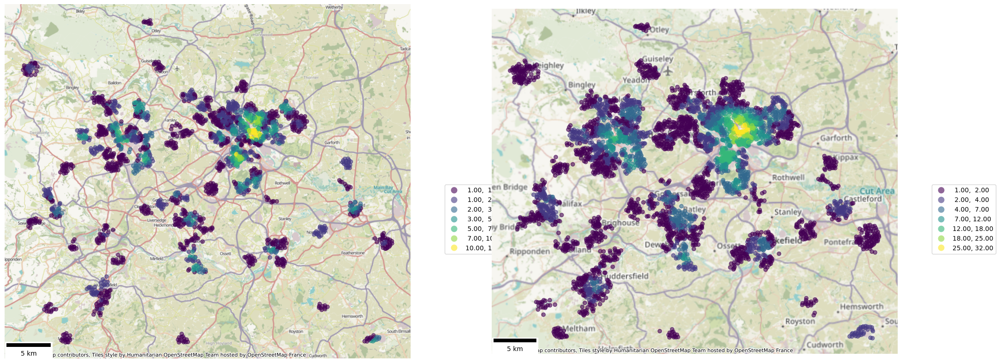

In [116]:
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as ctx

# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# First subplot for 'nc_walk_15'
wys_oa_f[wys_oa_f.nc_walk_15 > 0].to_crs(27700).plot(
    ax=ax1, column='nc_walk_15', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax1, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the first plot

# Second subplot for 'nc_walk_30'
wys_oa_f[wys_oa_f.nc_walk_30 > 0].to_crs(27700).plot(
    ax=ax2, column='nc_walk_30', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax2, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the second plot

# Add scale bars to each subplot
scale1 = ScaleBar(dx=1, location='lower left')  # Adjust dx based on units
ax1.add_artist(scale1)
ax2.add_artist(ScaleBar(dx=1, location='lower left'))

# Remove axis lines for both subplots
ax1.set_axis_off()
ax2.set_axis_off()

## 2.2 Accessibility within 15 and 30 minute using public transport (including walking and waiting times)

In [117]:
#load OD public transport time matrix
od_transit = pd.read_csv("2_processed data\OD travel time\OD_travel_time_multimodal_v2.csv")
od_transit.head()

,from_id,to_id,travel_time
0,E00059464,10032,30.0
1,E00059464,11994,59.0
2,E00059837,119,50.0
3,E00059837,977,35.0
4,E00059837,3600,59.0


In [118]:
#Identify number of charities accessible in 15 and 30 minute walking thresholds on OA level
# nc is short for Number of Charities
nc_transit_15 = od_transit[od_transit.travel_time <=15].groupby('from_id').count().reset_index()
nc_transit_15 = nc_transit_15.drop(['travel_time'], axis=1).rename(columns={"to_id":"nc_transit_15"})

nc_transit_30 = od_transit[od_transit.travel_time <=30].groupby('from_id').count().reset_index()
nc_transit_30 = nc_transit_30.drop(['travel_time'], axis=1).rename(columns={"to_id":"nc_transit_30"})

In [119]:
nc_transit_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2349 entries, 0 to 2348
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   from_id        2349 non-null   object
 1   nc_transit_15  2349 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 36.8+ KB


In [120]:
wys_oa_f = pd.merge(wys_oa_f, nc_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = pd.merge(wys_oa_f, nc_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.astype({"nc_transit_15": int, "nc_transit_30": int})
wys_oa_f.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4,0,7
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,0,4
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0,0,0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5,2,6


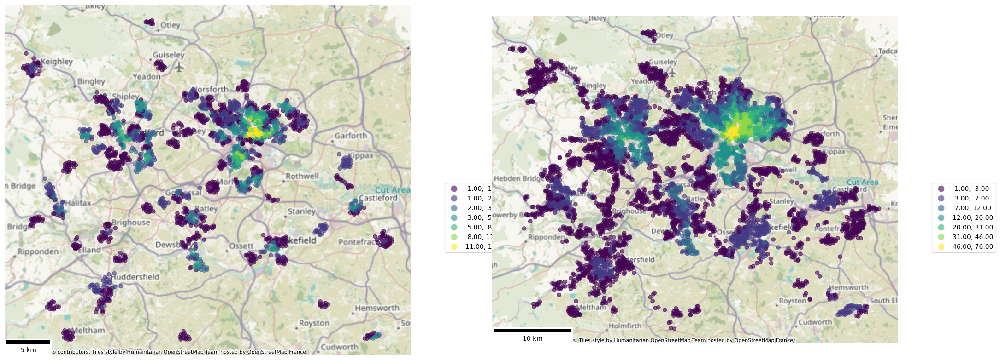

In [121]:
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# First subplot for 'nc_transit_15'
wys_oa_f[wys_oa_f.nc_transit_15 > 0].to_crs(27700).plot(
    ax=ax1, column='nc_transit_15', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax1, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the first plot

# Second subplot for 'nc_transit_30'
wys_oa_f[wys_oa_f.nc_transit_30 > 0].to_crs(27700).plot(
    ax=ax2, column='nc_transit_30', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax2, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the second plot

# Add scale bars to each subplot
scale1 = ScaleBar(dx=1, location='lower left')  # Adjust dx based on units
ax1.add_artist(scale1)
ax2.add_artist(ScaleBar(dx=1, location='lower left'))

# Remove axis lines for both subplots
ax1.set_axis_off()
ax2.set_axis_off()

## 2.3 Quantitiy of FS food accessible

**Load FS food data classified in the Eat Well Guide Classes. We limit our analysis for food supplied in 2023**

In [122]:
#we use data from 2023
fs_charity_food = pd.read_csv("1_raw data\FS RC Exports\FS_WYS_Charity_eatwell_annual.csv")
fs_charity_food_2023 = fs_charity_food[fs_charity_food.Year ==2023]
fs_charity_food_2023.eatwellcatagory_name.value_counts()

eatwellcatagory_name
Fruit and vegetables                                            191
Not Applicable                                                  190
Eat less often and in small amounts                             190
Potatoes, bread, rice, pasta and other starchy carbohydrates    189
Beans, pulses, fish, eggs, meat and other proteins              188
Dairy and alternatives                                          176
Oil & Spreads                                                    17
Name: count, dtype: int64

Then we create dataframes representing each food type

In [123]:
fs_fnv_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Fruit and vegetables"]
fs_na_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Not Applicable"]
fs_unhealthy_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Eat less often and in small amounts"]
fs_carb_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Potatoes, bread, rice, pasta and other starchy carbohydrates"]
fs_protien_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Beans, pulses, fish, eggs, meat and other proteins"]
fs_dairy_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Dairy and alternatives"]
fs_oil_2023 = fs_charity_food_2023[fs_charity_food_2023.eatwellcatagory_name == "Oil & Spreads"]

### Amount of food accessible by walking only 

#### a) within 15 minutes walking

In [124]:
# Amount of Fruit and vegetables accessible within 15 minute walk
fnv_walk_15 = pd.merge(od_walk, fs_fnv_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
fnv_walk_15 = fnv_walk_15[fnv_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, fnv_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"fnv_walk_15"})

# Amount of Not Applicable accessible within 15 minute walk
na_walk_15 = pd.merge(od_walk, fs_na_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
na_walk_15 = na_walk_15[na_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, na_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"na_walk_15"})

# Amount of Unhealthy Food "Eat less often and in small amounts" accessible within 15 minute walk
unhealthy_walk_15 = pd.merge(od_walk, fs_unhealthy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
unhealthy_walk_15 = unhealthy_walk_15[unhealthy_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, unhealthy_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"unhealthy_walk_15"})

# Amount of Carbs accessible within 15 minute walk
carb_walk_15 = pd.merge(od_walk, fs_carb_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
carb_walk_15 = carb_walk_15[carb_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, carb_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"carb_walk_15"})

# Amount of Protien accessible within 15 minute walk
protien_walk_15 = pd.merge(od_walk, fs_protien_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
protien_walk_15 = protien_walk_15[protien_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, protien_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"protien_walk_15"})

# Amount of Dairy accessible within 15 minute walk
dairy_walk_15 = pd.merge(od_walk, fs_dairy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
dairy_walk_15 = dairy_walk_15[dairy_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, dairy_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"dairy_walk_15"})

# Amount of Oils and Spread accessible within 15 minute walk
oil_walk_15 = pd.merge(od_walk, fs_oil_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
oil_walk_15 = oil_walk_15[oil_walk_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, oil_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"oil_walk_15"})

wys_oa_f.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30,fnv_walk_15,na_walk_15,unhealthy_walk_15,carb_walk_15,protien_walk_15,dairy_walk_15,oil_walk_15
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4,0,7,0.0,0.0,0.00,0.0,0.00,0.00,0.0
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,0,0.0,0.0,0.00,0.0,0.00,0.00,0.0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,0,4,0.0,0.0,0.00,0.0,0.00,0.00,0.0
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0,0,0,0.0,0.0,0.00,0.0,0.00,0.00,0.0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5,2,6,2973.2,280.1,927.52,929.2,1199.72,587.35,0.0


#### b) within 30 miuntes walking

In [125]:
# Amount of Fruit and vegetables accessible within 30 minute walk
fnv_walk_30 = pd.merge(od_walk, fs_fnv_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
fnv_walk_30 = fnv_walk_30[fnv_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, fnv_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"fnv_walk_30"})

# Amount of Not Applicable accessible within 30 minute walk
na_walk_30 = pd.merge(od_walk, fs_na_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
na_walk_30 = na_walk_30[na_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, na_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"na_walk_30"})

# Amount of Unhealthy Food "Eat less often and in small amounts" accessible within 30 minute walk
unhealthy_walk_30 = pd.merge(od_walk, fs_unhealthy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
unhealthy_walk_30 = unhealthy_walk_30[unhealthy_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, unhealthy_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"unhealthy_walk_30"})

# Amount of Carbs accessible within 30 minute walk
carb_walk_30 = pd.merge(od_walk, fs_carb_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
carb_walk_30 = carb_walk_30[carb_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, carb_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"carb_walk_30"})

# Amount of Protien accessible within 30 minute walk
protien_walk_30 = pd.merge(od_walk, fs_protien_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
protien_walk_30 = protien_walk_30[protien_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, protien_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"protien_walk_30"})

# Amount of Dairy accessible within 30 minute walk
dairy_walk_30 = pd.merge(od_walk, fs_dairy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
dairy_walk_30 = dairy_walk_30[dairy_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, dairy_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"dairy_walk_30"})

# Amount of Oils and Spread accessible within 30 minute walk
oil_walk_30 = pd.merge(od_walk, fs_oil_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
oil_walk_30 = oil_walk_30[oil_walk_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, oil_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"oil_walk_30"})

wys_oa_f.head()


,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30,nc_transit_15,...,protien_walk_15,dairy_walk_15,oil_walk_15,fnv_walk_30,na_walk_30,unhealthy_walk_30,carb_walk_30,protien_walk_30,dairy_walk_30,oil_walk_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4,0,...,0.00,0.00,0.0,5104.05,1135.34,2029.01,1852.48,2595.20,1620.75,3.0
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,0,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0,0,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5,2,...,1199.72,587.35,0.0,8434.80,1283.90,3312.37,3545.42,4530.96,2033.20,0.0


### Amount of food accessible by multimodal transport (bus + walking)

#### a) within a 15 minute multimodal trip

In [126]:
# Amount of Fruit and vegetables accessible within 15 minute transit
fnv_transit_15 = pd.merge(od_transit, fs_fnv_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
fnv_transit_15 = fnv_transit_15[fnv_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, fnv_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"fnv_transit_15"})

# Amount of Not Applicable accessible within 15 minute transit
na_transit_15 = pd.merge(od_transit, fs_na_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
na_transit_15 = na_transit_15[na_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, na_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"na_transit_15"})

# Amount of Unhealthy Food "Eat less often and in small amounts" accessible within 15 minute transit
unhealthy_transit_15 = pd.merge(od_transit, fs_unhealthy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
unhealthy_transit_15 = unhealthy_transit_15[unhealthy_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, unhealthy_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"unhealthy_transit_15"})

# Amount of Carbs accessible within 15 minute transit
carb_transit_15 = pd.merge(od_transit, fs_carb_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
carb_transit_15 = carb_transit_15[carb_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, carb_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"carb_transit_15"})

# Amount of Protien accessible within 15 minute transit
protien_transit_15 = pd.merge(od_transit, fs_protien_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
protien_transit_15 = protien_transit_15[protien_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, protien_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"protien_transit_15"})

# Amount of Dairy accessible within 15 minute transit
dairy_transit_15 = pd.merge(od_transit, fs_dairy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
dairy_transit_15 = dairy_transit_15[dairy_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, dairy_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"dairy_transit_15"})

# Amount of Oils and Spread accessible within 15 minute transit
oil_transit_15 = pd.merge(od_transit, fs_oil_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
oil_transit_15 = oil_transit_15[oil_transit_15.travel_time <=15].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, oil_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"oil_transit_15"})

wys_oa_f.head()


,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30,nc_transit_15,...,protien_walk_30,dairy_walk_30,oil_walk_30,fnv_transit_15,na_transit_15,unhealthy_transit_15,carb_transit_15,protien_transit_15,dairy_transit_15,oil_transit_15
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4,0,...,2595.20,1620.75,3.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,...,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,0,...,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0,0,...,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5,2,...,4530.96,2033.20,0.0,4902.25,864.6,1951.92,2097.69,2380.07,1408.2,0.0


#### b) within 30 miuntes multimodal trip

In [127]:
# Amount of Fruit and vegetables accessible within 30 minute transit
fnv_transit_30 = pd.merge(od_transit, fs_fnv_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
fnv_transit_30 = fnv_transit_30[fnv_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, fnv_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"fnv_transit_30"})

# Amount of Not Applicable accessible within 30 minute transit
na_transit_30 = pd.merge(od_transit, fs_na_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
na_transit_30 = na_transit_30[na_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, na_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"na_transit_30"})

# Amount of Unhealthy Food "Eat less often and in small amounts" accessible within 30 minute transit
unhealthy_transit_30 = pd.merge(od_transit, fs_unhealthy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
unhealthy_transit_30 = unhealthy_transit_30[unhealthy_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, unhealthy_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"unhealthy_transit_30"})

# Amount of Carbs accessible within 30 minute transit
carb_transit_30 = pd.merge(od_transit, fs_carb_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
carb_transit_30 = carb_transit_30[carb_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, carb_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"carb_transit_30"})

# Amount of Protien accessible within 30 minute transit
protien_transit_30 = pd.merge(od_transit, fs_protien_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
protien_transit_30 = protien_transit_30[protien_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, protien_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"protien_transit_30"})

# Amount of Dairy accessible within 30 minute transit
dairy_transit_30 = pd.merge(od_transit, fs_dairy_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
dairy_transit_30 = dairy_transit_30[dairy_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, dairy_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"dairy_transit_30"})

# Amount of Oils and Spread accessible within 30 minute transit
oil_transit_30 = pd.merge(od_transit, fs_oil_2023, how='left', left_on =['to_id'], right_on=['member_id']).drop(["to_id"],axis=1)
oil_transit_30 = oil_transit_30[oil_transit_30.travel_time <=30].groupby('from_id')['Food Moved KG'].agg('sum').reset_index()
wys_oa_f = pd.merge(wys_oa_f, oil_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_f = wys_oa_f.fillna(0)
wys_oa_f = wys_oa_f.rename(columns={"Food Moved KG":"oil_transit_30"})

wys_oa_f.head()


,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nc_walk_15,nc_walk_30,nc_transit_15,...,protien_transit_15,dairy_transit_15,oil_transit_15,fnv_transit_30,na_transit_30,unhealthy_transit_30,carb_transit_30,protien_transit_30,dairy_transit_30,oil_transit_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,4,0,...,0.00,0.0,0.0,7838.28,1855.95,2981.61,3499.692,3349.05,2489.45,3.0
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.000,0.00,0.00,0.0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,0,...,0.00,0.0,0.0,4748.57,5085.89,1638.72,2200.900,3194.94,1125.65,0.0
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,0,0,...,0.00,0.0,0.0,0.00,0.00,0.00,0.000,0.00,0.00,0.0
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,1,5,2,...,2380.07,1408.2,0.0,10976.00,1637.10,4119.82,4912.020,5992.15,2888.59,0.0


### Export FS food accessibility files on OA and LSOA level

In [128]:
#activate the following line if you want to export OA level file (WARNING: larger than 100 MB file. GitHub won't synch)
#wys_oa_f.to_crs(27700).to_file(r'2_processed data\2023_FS_wys_oa_accessiblity.geojson', driver="GeoJSON")

We then calculate average amounts of food accessible on an LSOA level 

In [129]:
wys_lsoa_f = wys_oa_f.drop(['OA21CD','geometry', 'geography code','pop_total','pop_u15','LSOA21NM'], axis=1).groupby('LSOA21CD').mean().reset_index()
wys_lsoa_f.head()

,LSOA21CD,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30,fnv_walk_15,na_walk_15,unhealthy_walk_15,carb_walk_15,protien_walk_15,...,protien_transit_15,dairy_transit_15,oil_transit_15,fnv_transit_30,na_transit_30,unhealthy_transit_30,carb_transit_30,protien_transit_30,dairy_transit_30,oil_transit_30
0,E01010568,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0
1,E01010569,0.0,0.333333,0.0,0.833333,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,823.100000,198.495,233.55,374.915000,196.740,168.225,0.0
2,E01010570,0.0,0.500000,0.0,0.500000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0
3,E01010571,0.0,0.666667,0.0,1.666667,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2433.691667,530.300,740.55,998.971667,811.575,537.575,0.0
4,E01010572,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0


In [130]:
lsoa_merge = wys_lsoa[['LSOA21CD', 'LSOA21NM', 'geometry']]

wys_lsoa_f = pd.merge(lsoa_merge, wys_lsoa_f, left_on='LSOA21CD', right_on= 'LSOA21CD', how='left')
wys_lsoa_f.head()

,LSOA21CD,LSOA21NM,geometry,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30,fnv_walk_15,na_walk_15,unhealthy_walk_15,...,protien_transit_15,dairy_transit_15,oil_transit_15,fnv_transit_30,na_transit_30,unhealthy_transit_30,carb_transit_30,protien_transit_30,dairy_transit_30,oil_transit_30
0,E01010568,Bradford 016A,"POLYGON ((416422.17 439366.289, 416475.128 439...",0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0
1,E01010569,Bradford 016B,"POLYGON ((415371.559 439225.549, 415417.28 439...",0.0,0.333333,0.0,0.833333,0.0,0.0,0.0,...,0.0,0.0,0.0,823.100000,198.495,233.55,374.915000,196.740,168.225,0.0
2,E01010570,Bradford 018A,"POLYGON ((413955.24 439413.594, 414146.534 439...",0.0,0.500000,0.0,0.500000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0
3,E01010571,Bradford 016C,"POLYGON ((415809.999 438803.797, 415760.976 43...",0.0,0.666667,0.0,1.666667,0.0,0.0,0.0,...,0.0,0.0,0.0,2433.691667,530.300,740.55,998.971667,811.575,537.575,0.0
4,E01010572,Bradford 016D,"POLYGON ((415579.831 439222.99, 415712.76 4391...",0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0


In [131]:
#load and merge age data for LSOAs 
age_lsoa = pd.read_csv("1_raw data\census_2021_NOMIS\census2021_Age by five-year age bands\census2021-ts007a-lsoa.csv")
age_lsoa.head()

age_lsoa['pop_u15'] = age_lsoa['Age: Aged 4 years and under']+age_lsoa['Age: Aged 5 to 9 years']+age_lsoa['Age: Aged 10 to 14 years']
age_lsoa = age_lsoa[['date','geography','geography code','Age: Total','pop_u15']]

age_merge = age_lsoa[['geography code','Age: Total','pop_u15']]
wys_lsoa_f = pd.merge(wys_lsoa_f, age_merge, left_on='LSOA21CD', right_on= 'geography code', how='left')

wys_lsoa_f.head()

,LSOA21CD,LSOA21NM,geometry,nc_walk_15,nc_walk_30,nc_transit_15,nc_transit_30,fnv_walk_15,na_walk_15,unhealthy_walk_15,...,fnv_transit_30,na_transit_30,unhealthy_transit_30,carb_transit_30,protien_transit_30,dairy_transit_30,oil_transit_30,geography code,Age: Total,pop_u15
0,E01010568,Bradford 016A,"POLYGON ((416422.17 439366.289, 416475.128 439...",0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0,E01010568,1716,275
1,E01010569,Bradford 016B,"POLYGON ((415371.559 439225.549, 415417.28 439...",0.0,0.333333,0.0,0.833333,0.0,0.0,0.0,...,823.100000,198.495,233.55,374.915000,196.740,168.225,0.0,E01010569,1752,317
2,E01010570,Bradford 018A,"POLYGON ((413955.24 439413.594, 414146.534 439...",0.0,0.500000,0.0,0.500000,0.0,0.0,0.0,...,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0,E01010570,1498,223
3,E01010571,Bradford 016C,"POLYGON ((415809.999 438803.797, 415760.976 43...",0.0,0.666667,0.0,1.666667,0.0,0.0,0.0,...,2433.691667,530.300,740.55,998.971667,811.575,537.575,0.0,E01010571,1946,399
4,E01010572,Bradford 016D,"POLYGON ((415579.831 439222.99, 415712.76 4391...",0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000,0.00,0.000000,0.000,0.000,0.0,E01010572,1486,205


In [132]:
# Export LSOA file
wys_lsoa_f.to_crs(27700).to_file(r'2_processed data\2023_FS_wys_lsoa_accessiblity.geojson', driver="GeoJSON")

## 2.4 Accessibility to Non FS charities 

### Accessibility within 15 and 30 minute walking

In [133]:
#load OD walking time matrix
nonFS_od_walk = pd.read_csv("2_processed data\OD travel time\OD_travel_time_walking_nonFS.csv")
nonFS_od_walk.head()

,from_id,to_id,travel_time
0,E00059837,non_FS_56,8.0
1,E00059455,non_FS_56,9.0
2,E00059456,non_FS_56,2.0
3,E00059836,non_FS_56,11.0
4,E00059835,non_FS_56,12.0


In [134]:
#Identify number of charities accessible in 15 and 30 minute walking thresholds on OA level
# nc is short for Number of Charities
nonFS_nc_walk_15 = nonFS_od_walk[nonFS_od_walk.travel_time <=15].groupby('from_id').count().reset_index()
nonFS_nc_walk_15 = nonFS_nc_walk_15.drop(['travel_time'], axis=1).rename(columns={"to_id":"nonFS_nc_walk_15"})

nonFS_nc_walk_30 = nonFS_od_walk[nonFS_od_walk.travel_time <=30].groupby('from_id').count().reset_index()
nonFS_nc_walk_30 = nonFS_nc_walk_30.drop(['travel_time'], axis=1).rename(columns={"to_id":"nonFS_nc_walk_30"})

In [135]:
wys_oa_nonFS = pd.merge(wys_oa, nonFS_nc_walk_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_nonFS = pd.merge(wys_oa_nonFS, nonFS_nc_walk_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_nonFS = wys_oa_nonFS.fillna(0)
wys_oa_nonFS = wys_oa_nonFS.astype({"nonFS_nc_walk_15": int, "nonFS_nc_walk_30": int})
wys_oa_nonFS.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nonFS_nc_walk_15,nonFS_nc_walk_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,1
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,2
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,0,1


### Accessibility within 15 and 30 minute using public transport (including walking and waiting times)

In [136]:
nonFS_od_transit = pd.read_csv("2_processed data\OD travel time\OD_travel_time_multimodal_nonFS.csv")
nonFS_od_transit.head()

,from_id,to_id,travel_time
0,E00059464,non_FS_56,39.0
1,E00059837,non_FS_56,8.0
2,E00059837,non_FS_58,56.0
3,E00059837,non_FS_61,55.0
4,E00059455,non_FS_56,9.0


In [137]:
#Identify number of charities accessible in 15 and 30 minute walking thresholds on OA level
# nc is short for Number of Charities
nonFS_nc_transit_15 = nonFS_od_transit[od_transit.travel_time <=15].groupby('from_id').count().reset_index()
nonFS_nc_transit_15 = nonFS_nc_transit_15.drop(['travel_time'], axis=1).rename(columns={"to_id":"nonFS_nc_transit_15"})

nonFS_nc_transit_30 = nonFS_od_transit[od_transit.travel_time <=30].groupby('from_id').count().reset_index()
nonFS_nc_transit_30 = nonFS_nc_transit_30.drop(['travel_time'], axis=1).rename(columns={"to_id":"nonFS_nc_transit_30"})

In [138]:
wys_oa_nonFS = pd.merge(wys_oa_nonFS, nonFS_nc_transit_15, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_nonFS = pd.merge(wys_oa_nonFS, nonFS_nc_transit_30, how='left', left_on =['OA21CD'], right_on=['from_id']).drop(["from_id"],axis=1)
wys_oa_nonFS = wys_oa_nonFS.fillna(0)
wys_oa_nonFS = wys_oa_nonFS.astype({"nonFS_nc_transit_15": int, "nonFS_nc_transit_30": int})
wys_oa_nonFS.head()

,OA21CD,geometry,LSOA21CD,LSOA21NM,geography code,pop_total,pop_u15,nonFS_nc_walk_15,nonFS_nc_walk_30,nonFS_nc_transit_15,nonFS_nc_transit_30
0,E00059063,POINT (435547.178 437859.211),E01011717,Leeds 029C,E00059063,328,77,0,1,1,1
1,E00054714,POINT (403970.892 437910.389),E01010861,Bradford 023F,E00054714,331,62,0,0,0,0
2,E00055286,POINT (407971.296 423883.178),E01010970,Calderdale 016B,E00055286,312,33,0,1,1,1
3,E00059020,POINT (440533.171 449476.152),E01011700,Leeds 002B,E00059020,288,55,0,2,1,1
4,E00060054,POINT (433997.312 421516.943),E01011910,Wakefield 020B,E00060054,254,23,0,1,0,1


Finally we add Fareshare's charities to calculate the total number of charities accessible

In [139]:
wys_oa_fs_merge = wys_oa_f[['OA21CD', 'nc_walk_15', 'nc_walk_30', 'nc_transit_15', 'nc_transit_30']]
wys_oa_all_charities = pd.merge(wys_oa_nonFS, wys_oa_fs_merge, how='left', left_on =['OA21CD'], right_on=['OA21CD'])
wys_oa_all_charities['nc_walk_15_all'] = wys_oa_all_charities['nonFS_nc_walk_15'] + wys_oa_all_charities['nc_walk_15']
wys_oa_all_charities['nc_walk_30_all'] = wys_oa_all_charities['nonFS_nc_walk_30'] + wys_oa_all_charities['nc_walk_30']
wys_oa_all_charities['nc_transit_15_all'] = wys_oa_all_charities['nonFS_nc_transit_15'] + wys_oa_all_charities['nc_transit_15']
wys_oa_all_charities['nc_transit_30_all'] = wys_oa_all_charities['nonFS_nc_transit_30'] + wys_oa_all_charities['nc_transit_30']

wys_oa_all_charities = wys_oa_all_charities.drop(['nc_walk_15', 'nc_walk_30', 'nc_transit_15', 'nc_transit_30', 
                                                  'nonFS_nc_walk_15', 'nonFS_nc_walk_30', 'nonFS_nc_transit_15', 'nonFS_nc_transit_30'], axis = 1)

wys_lsoa_all_charities = wys_oa_all_charities.drop(['OA21CD','geometry', 'geography code','pop_total','pop_u15', 'LSOA21NM'], axis=1).groupby('LSOA21CD').mean().reset_index()
wys_lsoa_all_charities = pd.merge(lsoa_merge, wys_lsoa_all_charities, left_on='LSOA21CD', right_on= 'LSOA21CD', how='left')
wys_lsoa_all_charities.head()


,LSOA21CD,LSOA21NM,geometry,nc_walk_15_all,nc_walk_30_all,nc_transit_15_all,nc_transit_30_all
0,E01010568,Bradford 016A,"POLYGON ((416422.17 439366.289, 416475.128 439...",0.000000,0.166667,0.0,0.000000
1,E01010569,Bradford 016B,"POLYGON ((415371.559 439225.549, 415417.28 439...",0.000000,2.500000,0.0,1.000000
2,E01010570,Bradford 018A,"POLYGON ((413955.24 439413.594, 414146.534 439...",0.000000,0.500000,0.0,1.250000
3,E01010571,Bradford 016C,"POLYGON ((415809.999 438803.797, 415760.976 43...",0.166667,3.666667,0.0,1.833333
4,E01010572,Bradford 016D,"POLYGON ((415579.831 439222.99, 415712.76 4391...",0.000000,1.400000,0.0,0.000000


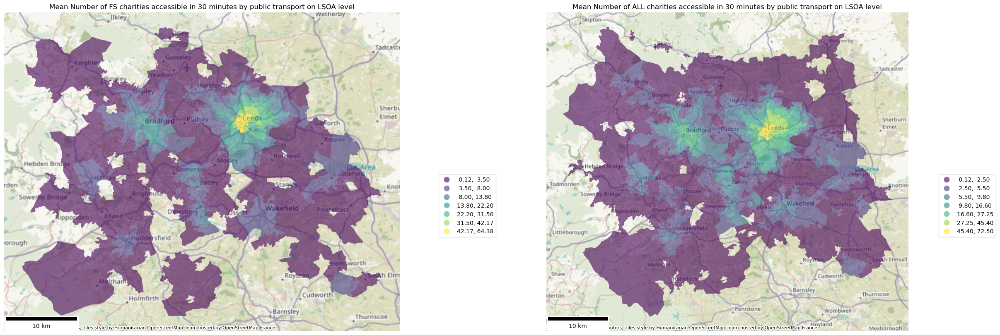

In [140]:
# Create a figure with two side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))

# First subplot for number of FS charities accessible within 30 minutes with Public Transport'nc_transit_30' 
wys_lsoa_f[wys_lsoa_f.nc_transit_30 > 0].to_crs(27700).plot(
    ax=ax1, column='nc_transit_30', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax1, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg1 = ax1.get_legend()
leg1.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the first plot


# Second subplot for number of ALL charities accessible within 30 minutes with Public Transport 'nc_transit_30_all'
wys_lsoa_all_charities[wys_lsoa_all_charities.nc_transit_30_all > 0].to_crs(27700).plot(
    ax=ax2, column='nc_transit_30_all', scheme='natural_breaks', cmap='viridis', k=7, legend=True, alpha=0.6
)
ctx.add_basemap(ax2, crs=27700, source=ctx.providers.OpenStreetMap.HOT)
leg2 = ax2.get_legend()
leg2.set_bbox_to_anchor((1.25, 0.5))  # Adjust legend position for the second plot

# Add scale bars to each subplot
scale1 = ScaleBar(dx=1, location='lower left')  # Adjust dx based on units
ax1.add_artist(scale1)
ax2.add_artist(ScaleBar(dx=1, location='lower left'))
ax1.set_title('Mean Number of FS charities accessible in 30 minutes by public transport on LSOA level')
ax2.set_title('Mean Number of ALL charities accessible in 30 minutes by public transport on LSOA level')


# Remove axis lines for both subplots
ax1.set_axis_off()
ax2.set_axis_off()

We can see that **NON-FS charities close the gap in FS service by serving some of the LSOAs that were unserved by FS**. Furhter analysis might reveal geographies of redundancy and complementarity of different charity networks.

In [141]:
#export geojson files
#activate the following line if you want to export OA level file (WARNING: larger than 100 MB file. GitHub won't synch)
# wys_oa_all_charities.to_crs(27700).to_file(r'2_processed data\2023_all_charities_wys_oa_accessiblity.geojson', driver="GeoJSON")
wys_lsoa_all_charities.to_crs(27700).to_file(r'2_processed data\2023_all_charities_wys_lsoa_accessiblity.geojson', driver="GeoJSON")